In [1]:


!pip install numpy



In [2]:
import numpy as np
print("NumPy is working! Version:", np.__version__)


NumPy is working! Version: 1.26.4


In [3]:
!pip install numpy pandas matplotlib seaborn scikit-learn xgboost


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder


In [5]:
import pandas as pd
df1 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2021_India.csv")
df2 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2022_India.csv")
df3 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2023_India.csv")

In [6]:
df1.head() 

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [7]:
df2.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,30.1138,80.0756,300.0,1.2,1.1,2022-01-01,511,Terra,MODIS,7,6.03,288.4,7.1,D,0
1,23.7726,86.2078,306.1,1.6,1.2,2022-01-01,512,Terra,MODIS,62,6.03,293.5,10.4,D,2
2,22.2080,84.8627,304.8,1.4,1.2,2022-01-01,512,Terra,MODIS,42,6.03,293.3,5.8,D,2
3,23.7621,86.3946,306.9,1.6,1.2,2022-01-01,512,Terra,MODIS,38,6.03,295.2,9.3,D,2
4,23.6787,86.0891,303.6,1.5,1.2,2022-01-01,512,Terra,MODIS,52,6.03,293.1,7.2,D,2


In [8]:
df3.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0
4,14.1723,75.5024,338.4,1.2,1.1,2023-01-01,823,Aqua,MODIS,88,61.03,305.3,41.5,D,0


In [9]:



df = pd.concat([df1, df2, df3], ignore_index=True)
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [10]:
df.shape

(271217, 15)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271217 entries, 0 to 271216
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   latitude    271217 non-null  float64
 1   longitude   271217 non-null  float64
 2   brightness  271217 non-null  float64
 3   scan        271217 non-null  float64
 4   track       271217 non-null  float64
 5   acq_date    271217 non-null  object 
 6   acq_time    271217 non-null  int64  
 7   satellite   271217 non-null  object 
 8   instrument  271217 non-null  object 
 9   confidence  271217 non-null  int64  
 10  version     271217 non-null  float64
 11  bright_t31  271217 non-null  float64
 12  frp         271217 non-null  float64
 13  daynight    271217 non-null  object 
 14  type        271217 non-null  int64  
dtypes: float64(8), int64(3), object(4)
memory usage: 31.0+ MB


In [12]:
df.isnull().sum()

latitude      0
longitude     0
brightness    0
scan          0
track         0
acq_date      0
acq_time      0
satellite     0
instrument    0
confidence    0
version       0
bright_t31    0
frp           0
daynight      0
type          0
dtype: int64

In [13]:
df.duplicated().sum()

0

In [14]:
df.columns

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type'],
      dtype='object')

In [15]:
df.describe()

,latitude,longitude,brightness,scan,track,acq_time,confidence,version,bright_t31,frp,type
count,271217.000000,271217.000000,271217.000000,271217.000000,271217.000000,271217.000000,271217.000000,271217.000000,271217.000000,271217.000000,271217.000000
mean,23.947505,81.284024,323.719192,1.421732,1.152716,824.623755,64.065081,21.933778,303.499177,27.722058,0.100385
std,4.919846,6.559071,14.147221,0.630742,0.201943,353.966965,18.165329,24.935515,8.282440,81.017471,0.437215
min,8.136200,68.452600,300.000000,1.000000,1.000000,321.000000,0.000000,6.030000,267.200000,0.000000,0.000000
25%,20.965500,75.880200,314.500000,1.000000,1.000000,648.000000,54.000000,6.030000,298.200000,8.700000,0.000000
50%,23.788800,79.320900,322.000000,1.200000,1.100000,756.000000,66.000000,6.030000,302.500000,13.500000,0.000000
75%,27.782700,84.755900,330.700000,1.500000,1.200000,825.000000,76.000000,61.030000,309.200000,24.500000,0.000000
max,34.973400,97.104400,505.700000,4.800000,2.000000,2202.000000,100.000000,61.030000,400.100000,6961.800000,3.000000


In [16]:
df.type.value_counts()

type
0    257625
2     13550
3        42
Name: count, dtype: int64

In [17]:
for col in df.columns:
  if df[col].dtype == 'object':
    print(f"Column: {col}")
    print(f"Unique values: {df[col].unique()}")
    print(f"Number of unique values: {df[col].nunique()}")
    print("-" * 50)

Column: acq_date
Unique values: ['2021-01-01' '2021-01-02' '2021-01-03' ... '2023-12-29' '2023-12-30'
 '2023-12-31']
Number of unique values: 1088
--------------------------------------------------
Column: satellite
Unique values: ['Terra' 'Aqua']
Number of unique values: 2
--------------------------------------------------
Column: instrument
Unique values: ['MODIS']
Number of unique values: 1
--------------------------------------------------
Column: daynight
Unique values: ['D' 'N']
Number of unique values: 2
--------------------------------------------------


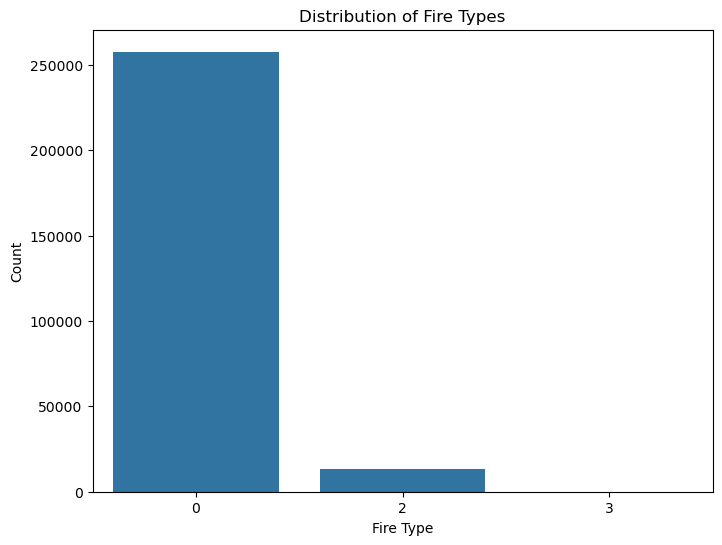

In [18]:
plt.figure(figsize=(8, 6))
sns.countplot(x='type', data=df)
plt.title('Distribution of Fire Types')
plt.xlabel('Fire Type')
plt.ylabel('Count')
plt.show()

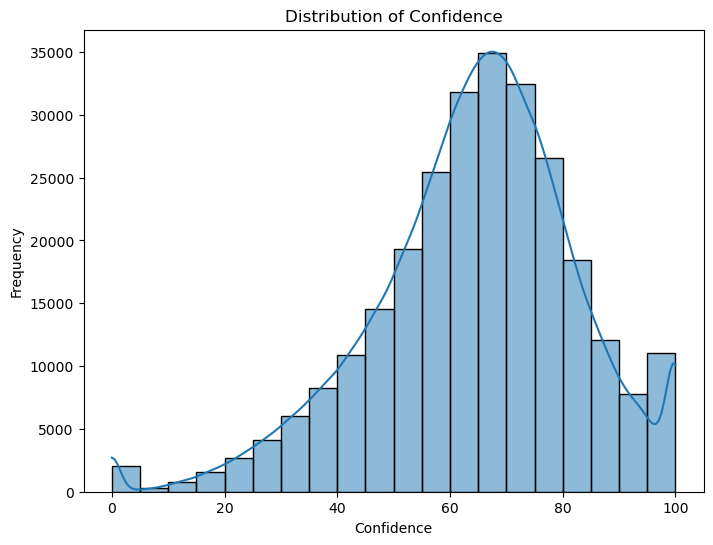

In [19]:
plt.figure(figsize=(8, 6))
sns.histplot(df['confidence'], bins=20, kde=True)
plt.title('Distribution of Confidence')
plt.xlabel('Confidence')
plt.ylabel('Frequency')
plt.show()


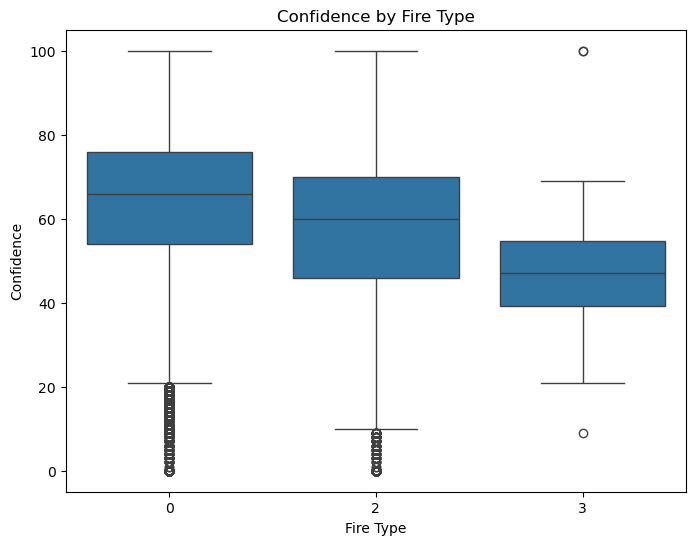

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.boxplot(x='type', y='confidence', data=df)
plt.title('Confidence by Fire Type')
plt.xlabel('Fire Type')
plt.ylabel('Confidence')
plt.show()

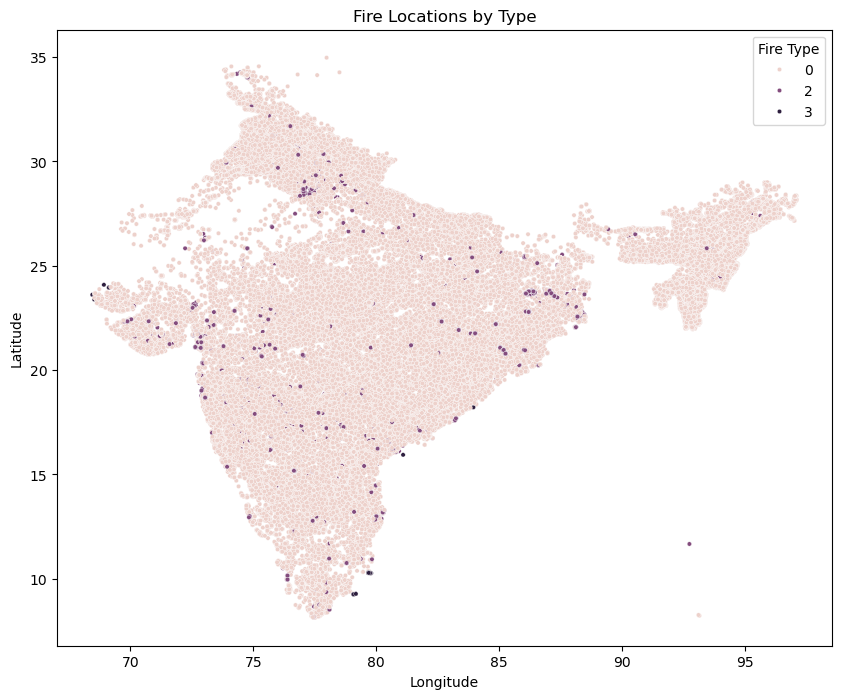

In [21]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=df, hue='type', s=10)
plt.title('Fire Locations by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Fire Type')
plt.show()

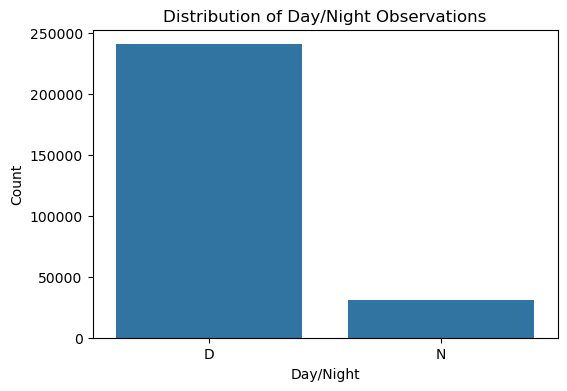

In [22]:
plt.figure(figsize=(6, 4))
sns.countplot(x='daynight', data=df)
plt.title('Distribution of Day/Night Observations')
plt.xlabel('Day/Night')
plt.ylabel('Count')
plt.show()

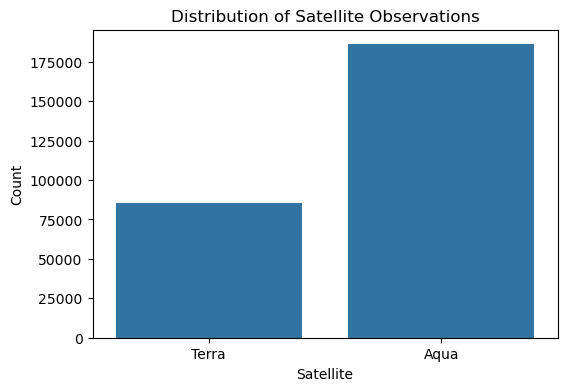

In [23]:
plt.figure(figsize=(6, 4))
sns.countplot(x='satellite', data=df)
plt.title('Distribution of Satellite Observations')
plt.xlabel('Satellite')
plt.ylabel('Count')
plt.show()

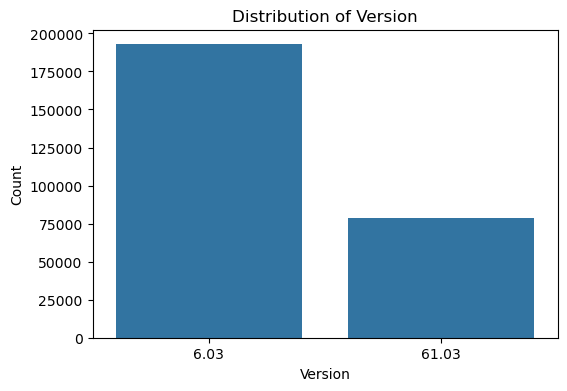

In [24]:
plt.figure(figsize=(6, 4))
sns.countplot(x='version', data=df)
plt.title('Distribution of Version')
plt.xlabel('Version')
plt.ylabel('Count')
plt.show()

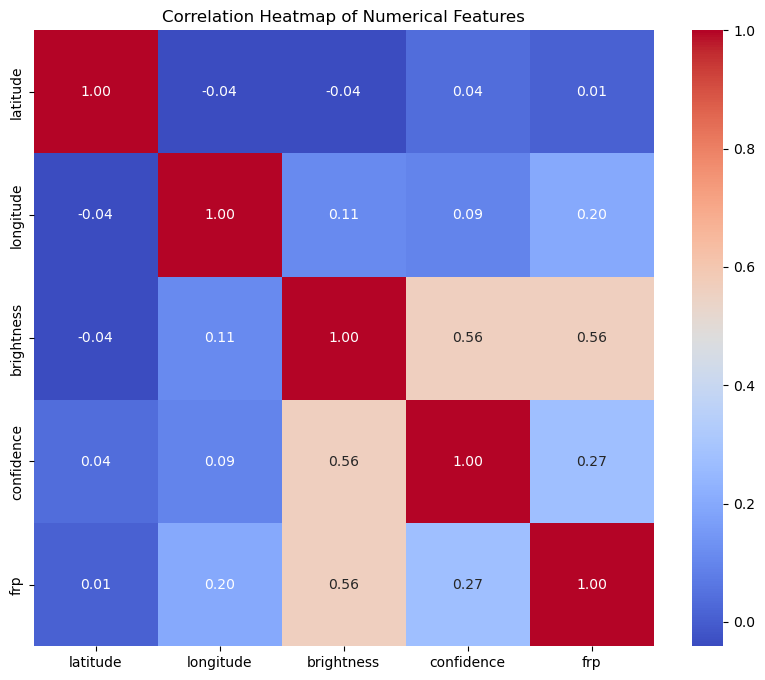

In [25]:
plt.figure(figsize=(10, 8))
correlation_matrix = df[['latitude', 'longitude', 'brightness', 'confidence', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()


In [26]:
numerical_cols = df.select_dtypes(include=np.number).columns

In [27]:
numerical_cols

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_time',
       'confidence', 'version', 'bright_t31', 'frp', 'type'],
      dtype='object')

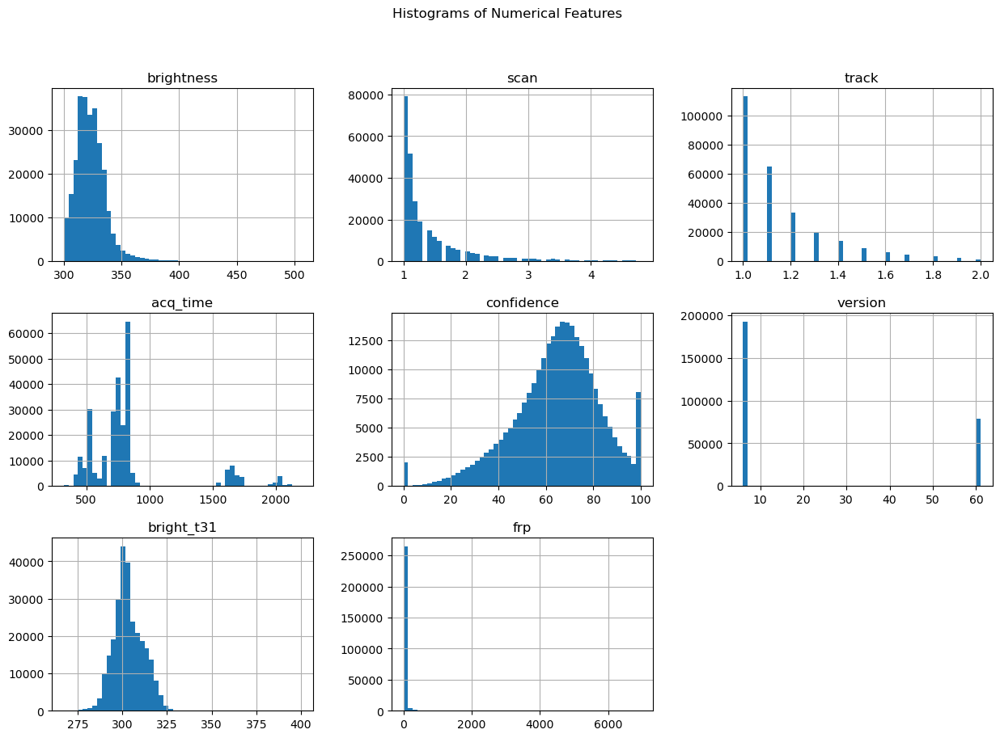

In [28]:
numerical_cols = ['brightness', 'scan', 'track', 'acq_time','confidence', 'version', 'bright_t31', 'frp']
df[numerical_cols].hist(bins=50, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()

Analyzing distribution for: brightness


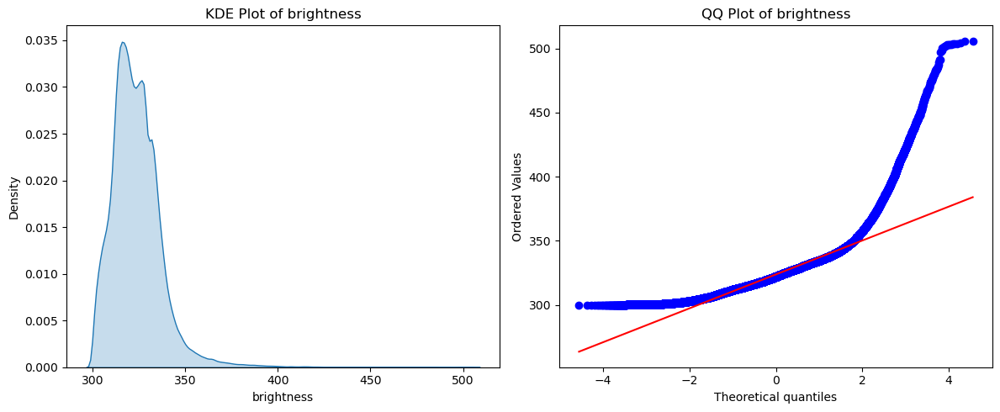

--------------------------------------------------
Analyzing distribution for: confidence


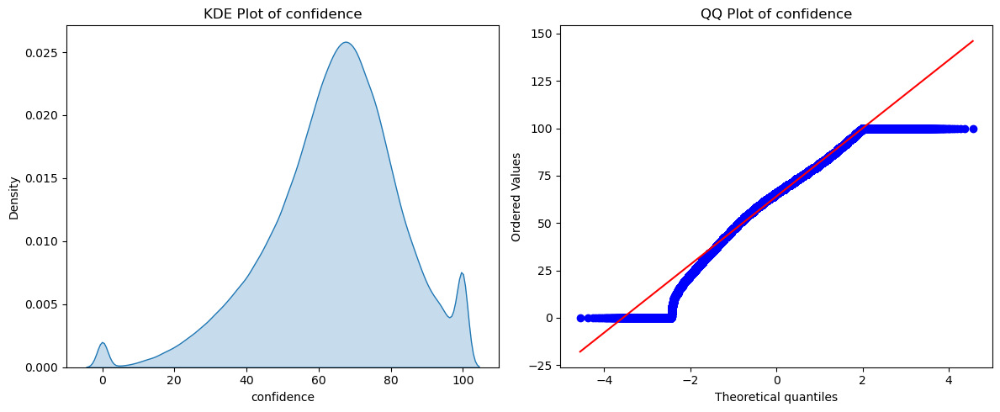

--------------------------------------------------
Analyzing distribution for: frp


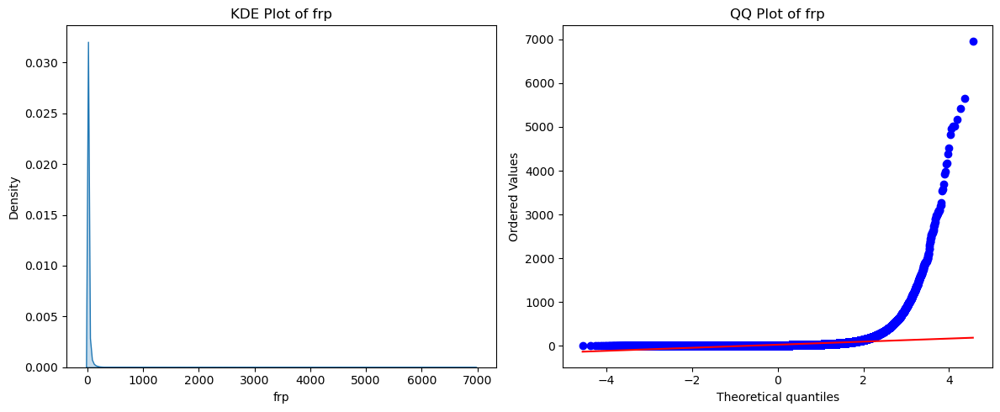

--------------------------------------------------
Analyzing distribution for: bright_t31


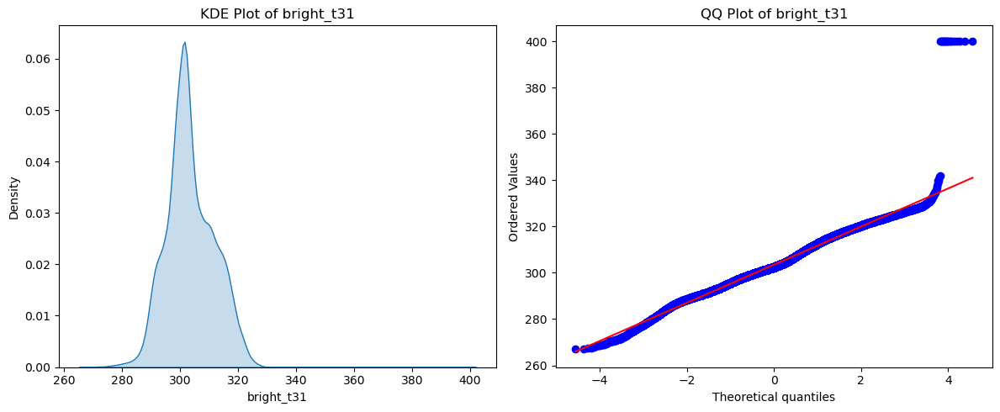

--------------------------------------------------
Analyzing distribution for: scan


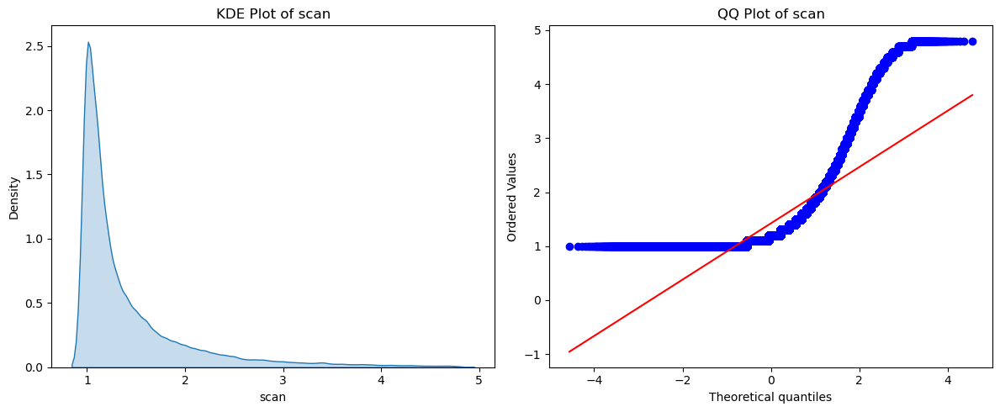

--------------------------------------------------
Analyzing distribution for: track


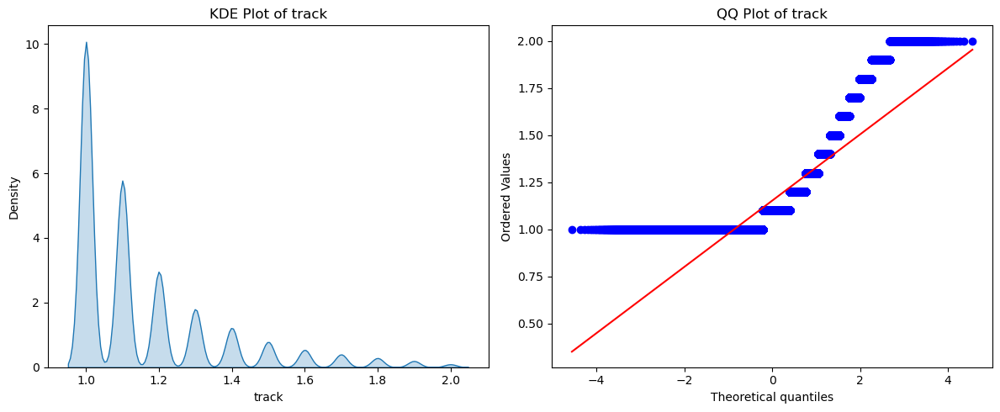

--------------------------------------------------


In [29]:
import statsmodels.api as sm
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df[feature], fill=True)

    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)


In [30]:
df['acq_date'] = pd.to_datetime(df['acq_date'])
# Extract temporal features
df['year'] = df['acq_date'].dt.year
df['month'] = df['acq_date'].dt.month
df['day_of_week'] = df['acq_date'].dt.dayofweek # Monday=0, Sunday=6
df['day_of_year'] = df['acq_date'].dt.dayofyear
df['hour'] = df['acq_time'].astype(str).str[:2].astype(int) 

C:\Users\Admin\AppData\Local\Temp\ipykernel_4592\2672674236.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='month', palette='viridis')


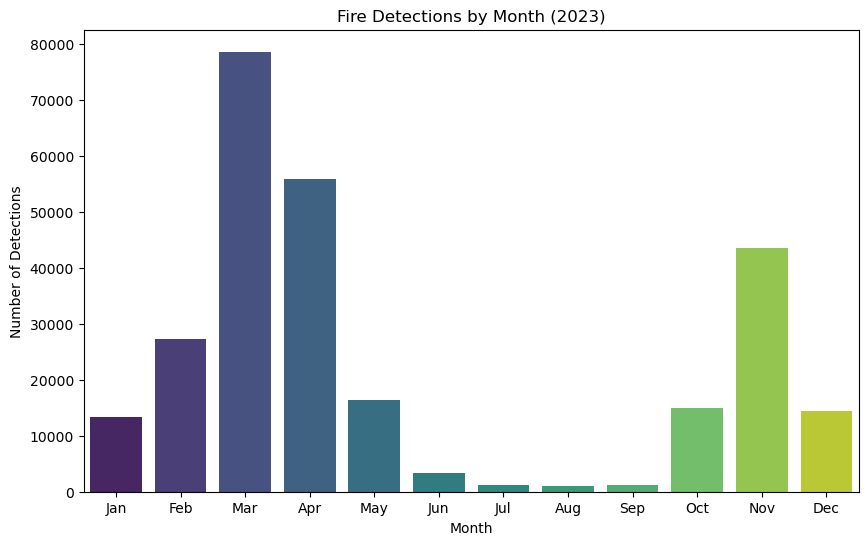

In [31]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='month', palette='viridis')
plt.title('Fire Detections by Month (2023)')
plt.xlabel('Month')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type', 'year', 'month', 'day_of_week',
       'day_of_year', 'hour'],
      dtype='object')


C:\Users\Admin\AppData\Local\Temp\ipykernel_4592\2145165000.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='day_of_week', palette='viridis')


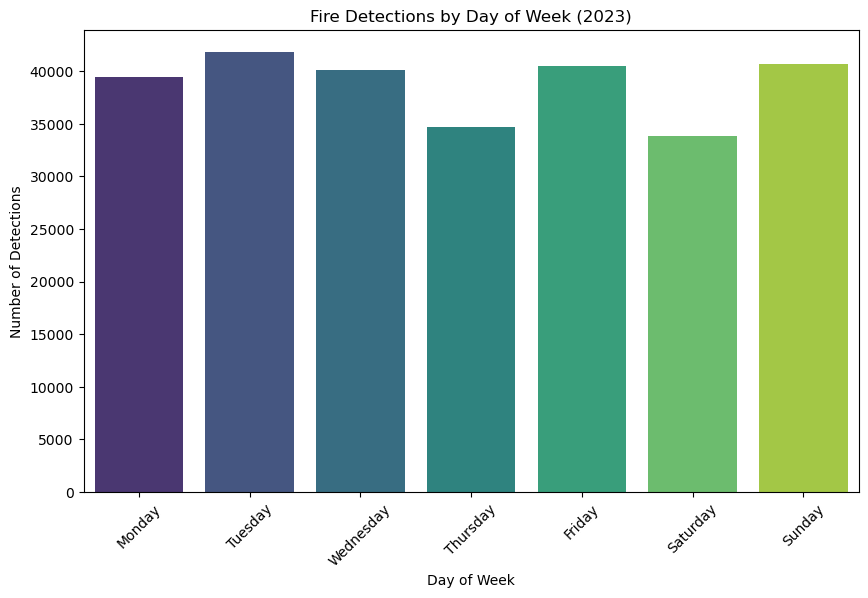

In [32]:
print(df.columns)
df['day_of_week'] = pd.to_datetime(df['acq_date']).dt.day_name()
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'acq_date' with your actual datetime column name
df['day_of_week'] = pd.to_datetime(df['acq_date']).dt.day_name()

# Optional: reorder days for consistent weekday order
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df['day_of_week'] = pd.Categorical(df['day_of_week'], categories=ordered_days, ordered=True)

# Plot
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='day_of_week', palette='viridis')
plt.title('Fire Detections by Day of Week (2023)')
plt.xlabel('Day of Week')
plt.ylabel('Number of Detections')
plt.xticks(rotation=45)
plt.show()


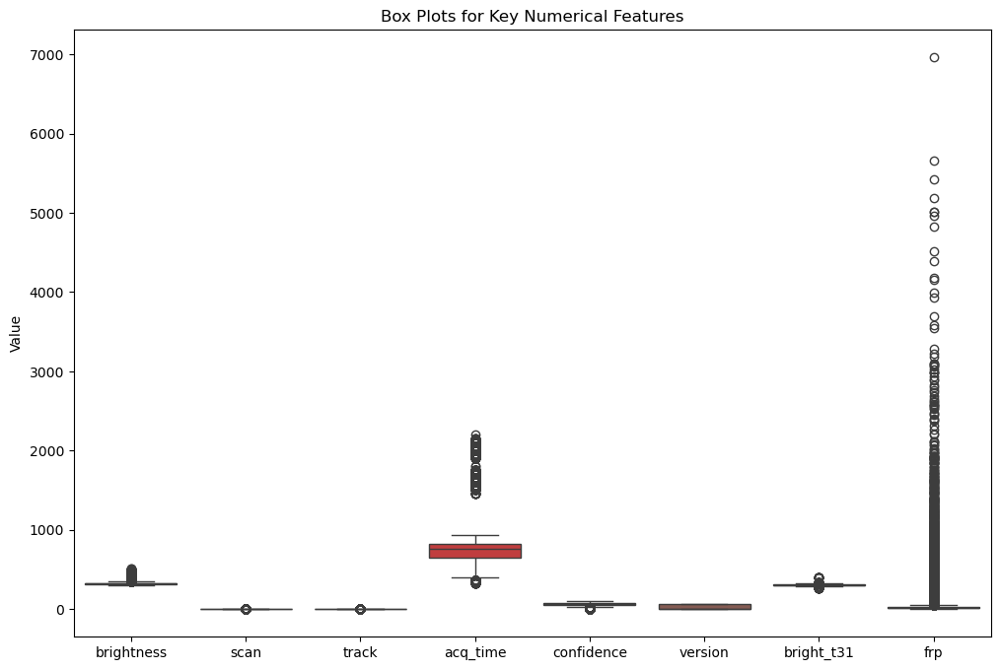

In [33]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Key Numerical Features')
plt.ylabel('Value')
plt.show()

In [34]:
def remove_outliers_iqr(df, column):
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  df_cleaned = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)].copy()
  return df_cleaned

# Apply outlier removal to numerical columns
for col in numerical_cols:
  df = remove_outliers_iqr(df, col)

print("Shape after removing outliers:", df.shape)

Shape after removing outliers: (189370, 20)


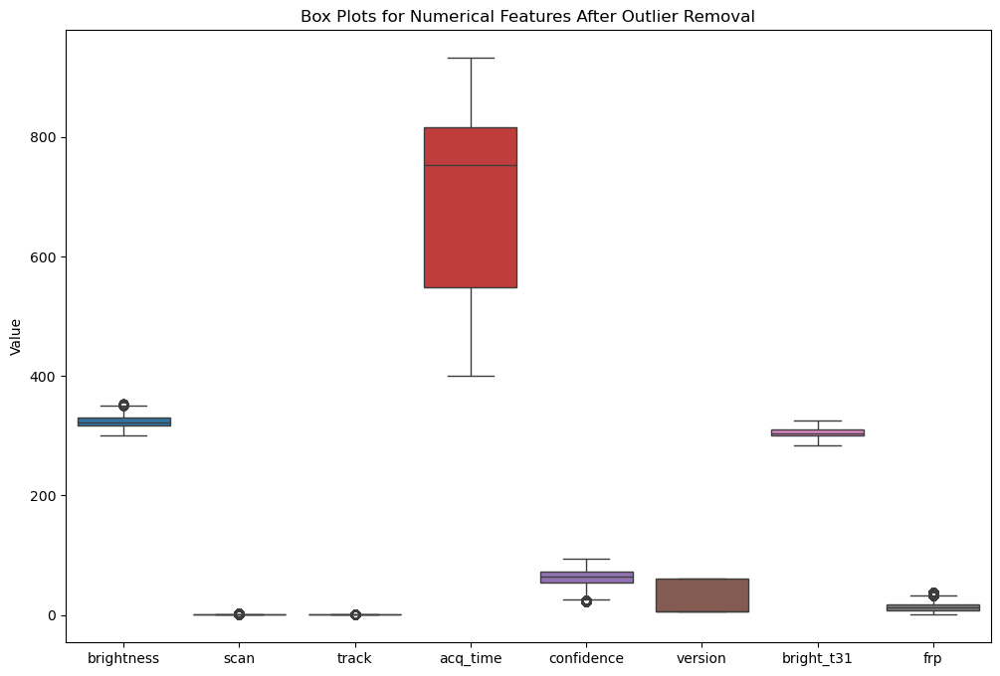

In [35]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Numerical Features After Outlier Removal')
plt.ylabel('Value')
plt.show()

In [36]:
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,year,month,day_of_week,day_of_year,hour
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0,2021,1,Friday,1,40
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0,2021,1,Friday,1,54
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0,2021,1,Friday,1,54
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0,2021,1,Friday,1,54
6,31.4366,76.8988,300.5,1.0,1.0,2021-01-01,547,Terra,MODIS,36,6.03,287.2,5.3,D,0,2021,1,Friday,1,54


In [37]:
df.type.value_counts()

type
0    182841
2      6501
3        28
Name: count, dtype: int64

In [38]:
categorical_cols = df.select_dtypes(include='object').columns

In [39]:
categorical_cols

Index(['satellite', 'instrument', 'daynight'], dtype='object')

In [40]:
categorical_cols_to_encode = ['daynight', 'satellite', 'instrument']


df_encoded = pd.get_dummies(df, columns=categorical_cols_to_encode, drop_first=True)

In [41]:
df_encoded.head(100)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,44,6.03,292.6,8.6,0,2021,1,Friday,1,40,True
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,37,6.03,287.4,9.0,0,2021,1,Friday,1,54,True
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,46,6.03,287.7,10.7,0,2021,1,Friday,1,54,True
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,43,6.03,287.6,9.0,0,2021,1,Friday,1,54,True
6,31.4366,76.8988,300.5,1.0,1.0,2021-01-01,547,36,6.03,287.2,5.3,0,2021,1,Friday,1,54,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,23.7766,86.3997,313.8,1.0,1.0,2021-01-02,454,51,6.03,300.9,6.8,2,2021,1,Saturday,2,45,True
117,23.6829,86.0831,310.4,1.1,1.0,2021-01-02,454,61,6.03,297.3,6.2,2,2021,1,Saturday,2,45,True
118,23.6661,86.9215,308.2,1.0,1.0,2021-01-02,454,50,6.03,297.4,4.8,2,2021,1,Saturday,2,45,True
119,23.8059,86.3222,313.5,1.0,1.0,2021-01-02,454,66,6.03,300.9,8.1,0,2021,1,Saturday,2,45,True


In [42]:
df_encoded.type.value_counts()

type
0    182841
2      6501
3        28
Name: count, dtype: int64

In [43]:
# 📦 Import required libraries
import pandas as pd
import folium

# 📂 Load MODIS datasets
df1 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2021_India.csv")
df2 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2022_India.csv")
df3 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2023_India.csv")

# 🔗 Merge into one DataFrame
df = pd.concat([df1, df2, df3], ignore_index=True)

# 🔄 Encode categorical features (adjust column names if needed)
categorical_cols = ['type', 'satellite']  # Replace with actual categorical columns in df
df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

# 🗺️ Create base map centered on India
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)

# 🎯 Sample up to 10,000 points for visualization
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# 🔵 Add fire points to the map
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']:.2f}, Date: {row['acq_date']}"
    ).add_to(india_map)

# 🖼️ Display map
india_map


In [44]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

df_encoded = pd.get_dummies(df, columns=['satellite'], drop_first=True)

label_encoder = LabelEncoder()
df['type_encoded'] = label_encoder.fit_transform(df['type'])

features = [col for col in df_encoded.columns if col != 'type_encoded']
X = df_encoded[features]
y = df['type_encoded']


In [45]:
X

,latitude,longitude,brightness,scan,track,acq_date,acq_time,instrument,confidence,version,bright_t31,frp,daynight,type,satellite_Terra
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,MODIS,44,6.03,292.6,8.6,D,0,True
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,MODIS,37,6.03,287.4,9.0,D,0,True
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,MODIS,8,6.03,286.5,5.4,D,0,True
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,MODIS,46,6.03,287.7,10.7,D,0,True
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,MODIS,43,6.03,287.6,9.0,D,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271212,17.1067,74.4049,304.0,2.3,1.5,2023-12-31,1715,MODIS,58,61.03,289.2,23.2,N,0,True
271213,16.3284,75.2590,304.2,2.6,1.5,2023-12-31,1715,MODIS,59,61.03,288.9,29.5,N,0,True
271214,21.1095,72.6422,306.5,1.9,1.3,2023-12-31,1716,MODIS,68,61.03,294.2,18.2,N,2,True
271215,21.0664,72.8734,310.0,1.0,1.0,2023-12-31,2125,MODIS,79,61.03,292.7,10.2,N,2,False


In [46]:
y

0         0
1         0
2         0
3         0
4         0
         ..
271212    0
271213    0
271214    1
271215    1
271216    1
Name: type_encoded, Length: 271217, dtype: int64

In [47]:
!pip install imbalanced-learn
!pip uninstall scikit-learn -y
!pip install scikit-learn==1.3.2
!pip install -U imbalanced-learn

Found existing installation: scikit-learn 1.3.2
Uninstalling scikit-learn-1.3.2:
  Successfully uninstalled scikit-learn-1.3.2


You can safely remove it manually.


  Using cached scikit_learn-1.3.2-cp312-cp312-win_amd64.whl.metadata (11 kB)
Using cached scikit_learn-1.3.2-cp312-cp312-win_amd64.whl (9.1 MB)


In [48]:
!pip uninstall -y imbalanced-learn scikit-learn
!conda install -c conda-forge scikit-learn=1.2.2 imbalanced-learn=0.11.0


!pip install scikit-learn==1.2.2 imbalanced-learn==0.11.0
from imblearn.over_sampling import SMOTE

Found existing installation: imbalanced-learn 0.13.0
Uninstalling imbalanced-learn-0.13.0:
  Successfully uninstalled imbalanced-learn-0.13.0
Found existing installation: scikit-learn 1.3.2
Uninstalling scikit-learn-1.3.2:
  Successfully uninstalled scikit-learn-1.3.2
Retrieving notices: done
Channels:
 - conda-forge
 - defaults
Platform: win-64



CondaHTTPError: HTTP 000 CONNECTION FAILED for url <https://conda.anaconda.org/conda-forge/win-64/repodata.json>
Elapsed: -

An HTTP error occurred when trying to retrieve this URL.
HTTP errors are often intermittent, and a simple retry will get you on your way.
'https//conda.anaconda.org/conda-forge/win-64'




  Using cached scikit-learn-1.2.2.tar.gz (7.3 MB)
  Installing build dependencies: started
  Installing build dependencies: still running...
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'error'


  error: subprocess-exited-with-error
  
  Preparing metadata (pyproject.toml) did not run successfully.
  exit code: 1
  
  [33 lines of output]
  Partial import of sklearn during the build process.
  Traceback (most recent call last):
    File "C:\Users\Admin\anaconda3\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 353, in <module>
      main()
    File "C:\Users\Admin\anaconda3\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 335, in main
      json_out['return_val'] = hook(**hook_input['kwargs'])
                               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    File "C:\Users\Admin\anaconda3\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_process.py", line 149, in prepare_metadata_for_build_wheel
      return hook(metadata_directory, config_settings)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    File "C:\Users\Admin\AppData\Local\Temp\pip-build-env-v_d92qph\overlay\Lib\site-packages\setuptools\

ModuleNotFoundError: No module named 'imblearn'

In [ ]:
# 📦 Import necessary libraries
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt

# 🎯 Define target column (update if needed)
target_col = 'confidence'  # Replace with actual target if different

# ✅ Check column names
print("Available columns:", df.columns.tolist())

# 🧹 Drop target from features
X = df.drop(columns=[target_col])
y = df[target_col]

# 🧠 Encode categorical features
X_encoded = pd.get_dummies(X, drop_first=True)

# ⚖️ Apply SMOTE to balance classes
smote = SMOTE(random_state=42, k_neighbors=2)
X_resampled, y_resampled = smote.fit_resample(X_encoded, y)

# 📊 Visualize class distribution before and after
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.countplot(x=y, ax=axes[0], palette='viridis')
axes[0].set_title("Original Class Distribution")
sns.countplot(x=y_resampled, ax=axes[1], palette='viridis')
axes[1].set_title("Resampled Class Distribution")
plt.tight_layout()
plt.show()

# 🧾 Print shapes
print("Original shape:", X.shape)
print("Resampled shape:", X_resampled.shape)


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42, stratify=y_resampled)

In [ ]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 🔍 Train and predict
loreg = LogisticRegression(max_iter=200)
loreg.fit(X_train, y_train)
loreg_pred = loreg.predict(X_test)
from sklearn.model_selection import train_test_split

# 🧪 Split resampled data
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)


# 📈 Evaluation metrics
score = accuracy_score(y_test, loreg_pred)
cr = classification_report(y_test, loreg_pred)

print("🔍 Logistic Regression Results")
print("Accuracy Score: {:.4f}".format(score))
print("\nClassification Report:\n", cr)

# 📊 Confusion Matrix
cm = confusion_matrix(y_test, loreg_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()



In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)
dtc_pred = dtc.predict(X_test)
score = accuracy_score(y_test,dtc_pred)
cr = classification_report(y_test,dtc_pred)

print("Decision Tree")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

In [ ]:
dt_cm = ConfusionMatrixDisplay.from_estimator(dtc, X_test, y_test)

In [ ]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
rfc_pred = rfc.predict(X_test)
score = accuracy_score(y_test,rfc_pred)
cr = classification_report(y_test,rfc_pred)

print("Random Forest")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

In [ ]:
rf_cm = ConfusionMatrixDisplay.from_estimator(rfc, X_test, y_test)

In [ ]:
# KNeighborsClassifier to Train from SKlearn
knnc = KNeighborsClassifier()
knnc.fit(X_train,y_train)
knn_pred = knnc.predict(X_test)
score = accuracy_score(y_test,knn_pred)
cr = classification_report(y_test,knn_pred)

print("KNeighbors Classifier")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

In [ ]:
knn_cm = ConfusionMatrixDisplay.from_estimator(knnc, X_test, y_test)

In [ ]:
# Collect the accuracies of each model
model_accuracies = {
    "Logistic Regression": accuracy_score(y_test, loreg_pred),
    "Decision Tree": accuracy_score(y_test, dtc_pred),
    "Random Forest": accuracy_score(y_test, rfc_pred),
    "KNeighbors Classifier": accuracy_score(y_test, knn_pred)
}

# Find the best model
best_model_name = max(model_accuracies, key=model_accuracies.get)
best_model_accuracy = model_accuracies[best_model_name]

print("Model Accuracies:")
for model, accuracy in model_accuracies.items():
    print(f"{model}: {accuracy:.4f}")

print(f"\nBest Model: {best_model_name} with Accuracy: {best_model_accuracy:.4f}")

In [ ]:
import joblib

# Save the best model
# Based on the previous output, let's assume Random Forest was the best model.
best_model = rfc

joblib.dump(best_model, 'best_fire_detection_model.pkl')

# Save the StandardScaler instance
joblib.dump(scaler, 'scaler.pkl')

print("Best model and scaler saved successfully.")

In [ ]:
# 📦 Import required libraries
import pandas as pd
import folium

# 📂 Load MODIS datasets
df1 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2021_India.csv")
df2 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2022_India.csv")
df3 = pd.read_csv(r"C:\Users\Admin\Downloads\modis_2023_India.csv")

# 🔗 Merge into one DataFrame
df = pd.concat([df1, df2, df3], ignore_index=True)

# 🔄 Encode categorical features (adjust column names if needed)
categorical_cols = ['type', 'satellite']  # Replace with actual categorical columns in df
df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

# 🗺️ Create base map centered on India
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)

# 🎯 Sample up to 10,000 points for visualization
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# 🔵 Add fire points to the map
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']:.2f}, Date: {row['acq_date']}"
    ).add_to(india_map)

# 🖼️ Display map
india_map


In [ ]:
scaler = StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])
df_encoded.head()